# 2. Research Question Analysis
---
<font color='gray'>
Prepared by Natalie Castro 
    
5/17/2025 </font> 

  
The purpose of this notebook is intended to explore our three research questions:

*1) What are the prevailing trends and patterns in how Bluesky users discuss climate change on social media on International Workers Day?

*2) What are the prevailing trends and patterns in how Bluesky users discuss worker's rights on social media on International Workers Day?

*3) What are the prevailing trends and patterns in how Bluesky users discuss worker's rights and climate change on social media on International Workers Day?

To answer the three reserach questions, a topic modeling approach will be utilized to understand what the identified nuance between the text is. BERTopic modeling will be employed. Results from the completed association rule mining will also be presented and visualized here.


---

## 1. Environment Creation

### 1.1 Library Import

In [164]:
''' FILE ACCESS '''

import json
import os
import glob
import smart_open
import csv

''' DATA QUERYING '''

import regex as re
import pandas as pd
import datetime
import datetime
from datetime import datetime
from dateutil.parser import parse

''' TEXT PROCESSING '''
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
stopwords = set(stopwords.words('english'))
import regex as re

''' SENTIMENT ANALYSIS '''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

''' TOPIC MODELING '''
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

''' DATA VISUALIZATION '''

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sb

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\natal\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\natal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [163]:
pip install vaderSentiment

Note: you may need to restart the kernel to use updated packages.


In [158]:
def topic_name_cleaner(topic):
    split_topic = topic.split("_")
    name = "\n".join(split_topic[1:])
    return (name)

In [199]:
def sentiment_symbol(score):
    if score > 0.1:
        return "+"
    elif score < -0.1:
        return "-"
    else:
        return "o"

### 1.2 Data Import

In [2]:
data = pd.read_csv("Climate and Workers Posts Posts - May 1st.csv ")

In [3]:
data.drop(columns=['Unnamed: 0.1', 'level_0','Unnamed: 0'], inplace=True)

#### 1.2.1 Time Normalization

In [5]:
''' CONVERTING CREATED AT TIME TO TIMESTAMP'''
def time_converter(timestamp):
    dt = parse(timestamp)
    formatted_date_time = dt.strftime('%Y-%m-%d %H:%M')
    return (formatted_date_time)

In [6]:
data['datetime'] = data['created_at'].apply(lambda x: time_converter(x))
data['datetime'] = pd.to_datetime(data['datetime'])


#### 1.2.2 Generating Labels for 'cliamte', 'labor', or 'both'.

| Climate | Labor |
|----------|----------|
| climate, global warming, carbon, sustainability, biodiversity, pollution, deforestation, renewable, extinction, mitigration, sea-level, fossil, termperature, sustainable future, greenhouse gases, save the planet, ecofriendly, reduce, reuse, recycle, green revolution, protect our planet, zero waste, future generations, SDG, going green, climate change, climate policy, climate decisions, climate regulation, environmental justice, climate justice, emissions policy, greenhouse gas regulation, carbon policy, energy policy, renewable energy policy, climate adaptation strategy, environmental protection policy, sustainable development regulation, green energy legislation, decarbonization plan, climate action framework, ecological regulation, environmental governance, green jobs policy, sustainable labor practices, just transition policy, climate-labor integration, environmentally sustainable labor laws, eco friendly workplace regulations, climate resilient employment policy   |planet over profit, workers day, international workers day, workers rights, labor policy, worker policy, labor decisions, labor regulation, employee protections, worker protections, labor rights, workplace regulations, union policy, collective bargaining, employment policy, wage policy, worker advocacy, labor reform, fair labor standards, job security regulations, employment equity, labor law changes, workforce decisions, green jobs policy, sustainable labor practices, climate-labor integration, environmentally sustainable labor laws, eco friendly workplace regulations, climate resilient employment policy, worker benefits, occupational safety, workplace safety standards, union organizing, employment protections, worker safety policy, wage equity, gig worker protections, blue collar labor policy, industrial relations, labor market regulation, employment law, minimum wage policy, employment standards, labor code enforcement, worker support services, rights of essential workers
|



In [7]:
climate_words = "(climate)|(global warming)|(carbon)|(sustainability)|(biodiversity)|(pollution)|(deforestation)|(renewable)|(extinction)|(mitigration)|(sea-level)|(fossil)|(termperature)|(sustainable future)|(greenhouse gases)|(save the planet)|(ecofriendly)|(reduce, reuse, recycle)|(green revolution)|(protect our planet)|(zero waste)|(future generations)|(SDG)|(going green)|(climate change)|(climate policy)|(climate decisions)|(climate regulation)|(environmental justice)|(climate justice)|(emissions policy)|(greenhouse gas regulation)|(carbon policy)|(energy policy)|(renewable energy policy)|(climate adaptation strategy)|(environmental protection policy)|(sustainable development regulation)|(green energy legislation)|(decarbonization plan)|(climate action framework)|(ecological regulation)|(environmental governance)|(green jobs policy)|(sustainable labor practices)|(just transition policy)|(climate-labor integration)|(environmentally sustainable labor laws)|(eco friendly workplace regulations)|(climate resilient employment policy)"
labor_words = '(planet over profit)|(workers day)|(international workers day)|(workers rights)|(labor policy)|(worker policy)|(labor decisions)|(labor regulation)|(employee protections)|(worker protections)|(labor rights)|(workplace regulations)|(union policy)|(collective bargaining)|(employment policy)|(wage policy)|(worker advocacy)|(labor reform)|(fair labor standards)|(job security regulations)|(employment equity)|(labor law changes)|(workforce decisions)|(green jobs policy)|(sustainable labor practices)|(climate-labor integration)|(environmentally sustainable labor laws)|(eco friendly workplace regulations)|(climate resilient employment policy)|(worker benefits)|(occupational safety)|(workplace safety standards)|(union organizing)|(employment protections)|(worker safety policy)|(wage equity)|(gig worker protections)|(blue collar labor policy)|(industrial relations)|(labor market regulation)|(employment law)|(minimum wage policy)|(employment standards)|(labor code enforcement)|(worker support services)|(rights of essential workers)'

In [8]:
def label_maker(post):
    current_post = post.lower()
    current_post = re.sub(r'[^a-zA-Z\d\s]','',current_post)

    ## Counting the number of words for each label type
    climate_post_matches = re.findall(climate_words,current_post)
    labor_post_matches = re.findall(labor_words, current_post)

    if len(climate_post_matches) != 0:
        if len(labor_post_matches) != 0:
            return ("BOTH")

        else:
            return ("CLIMATE")

    elif len(labor_post_matches) != 0:
        if len(climate_post_matches) == 0:
            return ('LABOR')


In [9]:
data['LABEL'] = data['clean text'].apply(lambda x: label_maker(x))

In [18]:
data.to_csv('Labeled Sample Data.csv')

In [13]:
climate_condition = data['LABEL'] == 'CLIMATE'
climate_only = data[climate_condition]

labor_condition = data['LABEL'] == 'LABOR'
labor_only = data[labor_condition]

both_condition = data['LABEL'] == 'BOTH'
both_only = data[both_condition]

print (f'The total number of posts are: {len(data)}.')
print (f'The total number of posts that only mention climate are: {len(climate_only)}. ({len(climate_only)/len(data)}%)')
print (f'The total number of posts that only mention labor are: {len(labor_only)}. ({len(labor_only)/len(data)}%')
print (f'The total number of posts that both mention labor and cliamte are: {len(both_only)}. ({len(both_only)/len(data)}%)')

The total number of posts are: 9697.
The total number of posts that only mention climate are: 7684. (0.7924100237186759%)
The total number of posts that only mention labor are: 1746. (0.1800556873259771%
The total number of posts that both mention labor and cliamte are: 15. (0.0015468701660307311%)


In [23]:
climate_only.to_csv("Sample of Climate Only.csv")
labor_only.to_csv("Sample of Labor Only.csv")
both_only.to_csv("Sample of Both.csv")

### 1.3 ARM Visualizations:

Here, I am generating the ARM visualizaitons, I just like how they look better in Python

#### 1.3.1 Climate ARM Visualizations

| #   | lhs       | => | rhs        | support   | confidence | coverage  | lift     | count |
|-----|-----------|----|------------|-----------|------------|-----------|----------|-------|
| 1   | {climate} | => | {precip}   | 0.15417139| 0.35276074 | 0.4370424 | 2.288108 | 1495  |
| 2   | {climate} | => | {fri}      | 0.01567495| 0.03586597 | 0.4370424 | 2.288108 | 152   |
| 3   | {climate} | => | {iembot}   | 0.07538414| 0.17248702 | 0.4370424 | 2.288108 | 731   |
| 4   | {climate} | => | {depth}    | 0.06146231| 0.14063237 | 0.4370424 | 2.284275 | 596   |
| 5   | {climate} | => | {thu}      | 0.05950294| 0.13614913 | 0.4370424 | 2.280204 | 577   |
| 6   | {climate} | => | {snow}     | 0.15458389| 0.35370458 | 0.4370424 | 2.278986 | 1499  |
| 7   | {climate} | => | {trace}    | 0.02114056| 0.04837187 | 0.4370424 | 2.277000 | 205   |
| 8   | {climate} | => | {apr}      | 0.04011550| 0.09178858 | 0.4370424 | 2.276404 | 389   |
| 9   | {climate} | => | {missing}  | 0.07899350| 0.18074563 | 0.4370424 | 2.273269 | 766   |
| 10  | {climate} | => | {additional}| 0.07579664| 0.17343086 | 0.4370424 | 2.272647 | 735   |


In [3]:
data = {
    "rhs": ["precip", "fri", "iembot", "depth", "thu", "snow", "trace", "apr", "missing", "additional"],
    "confidence": [0.35276074, 0.03586597, 0.17248702, 0.14063237, 0.13614913, 0.35370458, 0.04837187, 0.09178858, 0.18074563, 0.17343086],
    "count": [1495, 152, 731, 596, 577, 1499, 205, 389, 766, 735]
}

climate_rules = pd.DataFrame(data)

In [15]:
climate_rules.sort_values(by='count', ascending=False, inplace=True)

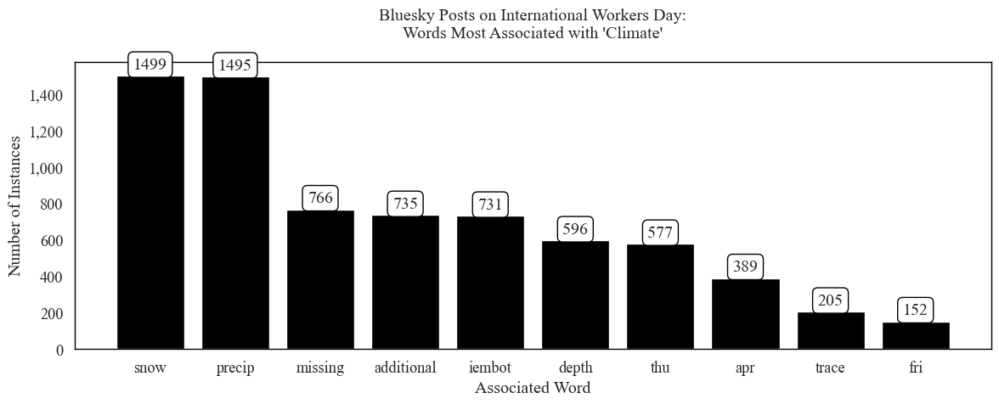

In [20]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=climate_rules, x="rhs", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nWords Most Associated with 'Climate'\n")
hist.set_xlabel("Associated Word")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)


# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Words Most Associated With Climate.png",dpi=500)
plt.show();

#### 1.3.2 Workers Associations

| #   | lhs       | rhs            | support    | confidence | coverage   | lift     | count |
|-----|-----------|----------------|------------|------------|------------|----------|-------|
| [1] | {workers} | {international}| 0.11426214 | 0.66827503 | 0.1709807  | 5.605764 | 1108  |
| [2] | {workers} | {solidarity}   | 0.01557183 | 0.09107358 | 0.1709807  | 5.485345 | 151   |
| [3] | {workers} | {happy}        | 0.04929360 | 0.28829916 | 0.1709807  | 5.428421 | 478   |
| [4] | {workers} | {mayday}       | 0.02444055 | 0.14294331 | 0.1709807  | 5.310809 | 237   |
| [5] | {workers} | {day}          | 0.14354955 | 0.83956574 | 0.1709807  | 5.152702 | 1392  |
| [6] | {workers} | {celebrate}    | 0.01247809 | 0.07297949 | 0.1709807  | 5.091238 | 121   |
| [7] | {workers} | {rights}       | 0.05011859 | 0.29312425 | 0.1709807  | 4.400040 | 486   |
| [8] | {workers} | {fight}        | 0.01082809 | 0.06332931 | 0.1709807  | 3.862291 | 105   |
| [9] | {workers} | {labor}        | 0.02041869 | 0.11942099 | 0.1709807  | 3.784397 | 198   |
| [10]| {workers} | {on}           | 0.01072497 | 0.06272618 | 0.1709807  | 3.777986 | 104   |


In [22]:
labor_rules = pd.DataFrame({
    'lhs': ['workers'] * 10,
    'rhs': [
        'international', 'solidarity', 'happy', 'mayday', 'day',
        'celebrate', 'rights', 'fight', 'labor', 'on'
    ],
    'count': [1108, 151, 478, 237, 1392, 121, 486, 105, 198, 104]
})


labor_rules.sort_values(by='count', ascending=False, inplace=True)

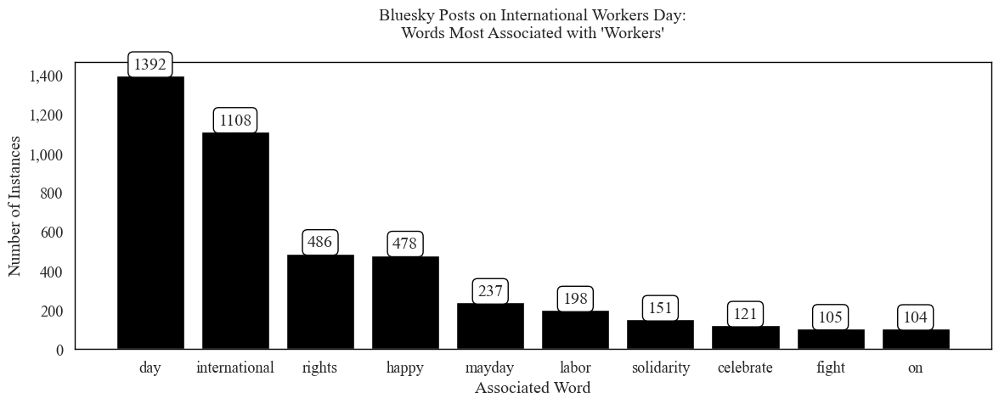

In [23]:
sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=labor_rules, x="rhs", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nWords Most Associated with 'Workers'\n")
hist.set_xlabel("Associated Word")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)


# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Words Most Associated With Workers.png",dpi=500)
plt.show();

### 1.4 Pushing Models to Hugging Face

In [72]:
from huggingface_hub import login

In [73]:
login()

In [102]:
topic_model.save("bsky-posts-5-1",serialization='pickle',save_embedding_model=True,save_ctfidf=True,)

2025-05-17 20:33:25,127 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [ ]:

# Push to HuggingFace Hub
topic_model.push_to_hf_hub(
    repo_id="nataliecastro/repo-hidden",
    save_ctfidf=True,
    private=True,
    commit_message='Pushing the full corpus topic model',
    save_embedding_model=True,
)


## 2. RQ 1: What are the prevailing trends and patterns in how Bluesky users discuss climate change on social media on International Workers Day?

In [106]:
climate_only = pd.read_csv("Sample of Climate Only.csv")

### 2.1 Instantiating a topic model

In [107]:
vectorizer_model = CountVectorizer(ngram_range=(1, 3), stop_words="english",decode_error='replace',strip_accents='ascii',
                                  lowercase=True)
climate_topic_model = BERTopic(vectorizer_model=vectorizer_model,verbose=True)

In [108]:
climate_docs = climate_only['clean text'].to_list()
  ## Using model.fit_transform, to apply to the list of documents. This will both embedd and assign topics to the texts in the document lists.
climate_topics, climate_probs = climate_topic_model.fit_transform(climate_docs)

2025-05-17 20:34:28,677 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/241 [00:00<?, ?it/s]

2025-05-17 20:35:45,280 - BERTopic - Embedding - Completed ✓
2025-05-17 20:35:45,281 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-17 20:35:55,613 - BERTopic - Dimensionality - Completed ✓
2025-05-17 20:35:55,616 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-17 20:35:56,189 - BERTopic - Cluster - Completed ✓
2025-05-17 20:35:56,196 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-05-17 20:35:57,925 - BERTopic - Representation - Completed ✓


In [109]:
reduced_topics = climate_topic_model.reduce_outliers(climate_docs, climate_topics)
climate_topic_model.update_topics(climate_docs, topics=reduced_topics)
climate_topics = climate_topic_model.get_topics()

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:01<00:00,  1.71it/s]
2025-05-17 20:36:00,795 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [110]:
climate_topic_info = climate_topic_model.get_topic_info()

```python
climate_topic_info
```
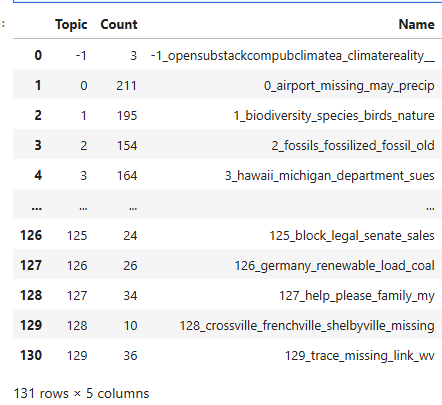

(The dataframe is truncated here to hide the user posts from the representative documents)

In [112]:
climate_topic_info.to_csv("Climate Post Only Topic Info.csv")

#### 2.2 Visualizing The Topics

In [113]:
climate_intertopic_distances = climate_topic_model.visualize_topics()

In [114]:
climate_intertopic_distances

In [115]:
climate_intertopic_distances.write_html("Climate Sample Intertopic Distances.html")

In [116]:
''' Visualize hierarhcies through text trees:'''
climate_hierarchical_topics = climate_topic_model.hierarchical_topics(climate_docs)
climate_tree = climate_topic_model.get_topic_tree(climate_hierarchical_topics)
print (climate_tree)

100%|███████████████████████████████████████████████████████████████████████████████| 129/129 [00:01<00:00, 121.58it/s]


.
├─snow_precip_high_low_may
│    ├─missing_airport_precip_high_low
│    │    ├─airport_missing_may_ca_precip
│    │    │    ├─■──crossville_frenchville_shelbyville_missing_may ── Topic: 128
│    │    │    └─airport_missing_may_ca_precip
│    │    │         ├─airport_missing_ca_may_precip
│    │    │         │    ├─■──ca_missing_fri_az_may ── Topic: 26
│    │    │         │    └─■──airport_missing_may_precip_high ── Topic: 0
│    │    │         └─■──rome_quincy_athens_missing_may ── Topic: 83
│    │    └─missing_ks_precip_link_high
│    │         ├─ks_mo_missing_precip_high
│    │         │    ├─■──ks_missing_city_kansas_precip ── Topic: 32
│    │         │    └─mo_missing_apr_precip_high
│    │         │         ├─■──missing_mo_kirksville_clarksville_zanesville ── Topic: 78
│    │         │         └─■──mo_joseph_plains_west_cape ── Topic: 76
│    │         └─trace_ia_link_apr_snow
│    │              ├─trace_missing_wv_link_precip
│    │              │    ├─■──hagerstown_johnstown_mo

### 2.3 Generating Topic Frequencies

In [138]:
def frequency_counter(topics, docs, topic_info, corpora_n, topic_model):
    ''' COUNTING THE NUMBER OF REPRESENTATIVE DOCUMENTS BELONGING TO EACH INSTANCE '''
    climate_documents = topic_info.explode("Representative_Docs")
    climate_documents.reset_index(inplace=True)
    document_info = topic_model.get_document_info(docs)

    topic_filtered = []

    for topic in topics:
        current_condition = document_info['Topic'] == topic
        current_documents = document_info[current_condition]
        
        topic_filtered.append(current_documents)

    ''' STRUCUTURING THE COUNTS '''
    climate_document_info = pd.concat(topic_filtered)
    topic_counts = climate_document_info['Name'].value_counts()
    document_frequencies = pd.DataFrame(topic_counts)
    document_frequencies.reset_index(inplace=True)
    
    document_frequencies['Percentage'] = document_frequencies['count'].apply(lambda x: x/corpora_n)
    document_frequencies.reset_index(inplace=True)
    document_frequencies.reset_index(inplace=True)
    document_frequencies.rename(columns={"Count":"Frequnecy",},inplace=True)
    name_and_topic = climate_document_info[['Topic','Name']].copy().drop_duplicates()
    document_frequencies = document_frequencies.merge(right=name_and_topic,on='Name')
    document_frequencies['Topic Name Clean'] = document_frequencies['Name'].apply(lambda x: topic_name_cleaner(x))
    return (document_frequencies)

In [139]:
climate_frequencies = frequency_counter(climate_topics, climate_docs, climate_topic_info, len(climate_only), climate_topic_model)

In [140]:
climate_frequencies

,level_0,index,Name,count,Percentage,Topic,Topic Name Clean
0,0,0,15_change_warming_global_about,307,0.039953,15,change\nwarming\nglobal\nabout
1,1,1,13_missing_may_iembot_additional,301,0.039172,13,missing\nmay\niembot\nadditional
2,2,2,9_depth_snow_precip_may,226,0.029412,9,depth\nsnow\nprecip\nmay
3,3,3,12_fossil_fuel_fuels_lynch,218,0.028371,12,fossil\nfuel\nfuels\nlynch
4,4,4,0_airport_missing_may_precip,211,0.027460,0,airport\nmissing\nmay\nprecip
...,...,...,...,...,...,...,...
126,126,126,113_mn_twin_chanhassen_cloud,15,0.001952,113,mn\ntwin\nchanhassen\ncloud
127,127,127,109_nj_trenton_newark_atlantic,15,0.001952,109,nj\ntrenton\nnewark\natlantic
128,128,128,124_insideclimatenewsorgnews_bad_close_check,14,0.001822,124,insideclimatenewsorgnews\nbad\nclose\ncheck
129,129,129,128_crossville_frenchville_shelbyville_missing,10,0.001301,128,crossville\nfrenchville\nshelbyville\nmissing


In [141]:
climate_frequencies.to_csv("Climate Topic Frequencies.csv")

In [142]:
climate_freq_plotting

,level_0,index,Name,count,Percentage,Topic
0,0,0,15_change_warming_global_about,307,0.039953,15
1,1,1,13_missing_may_iembot_additional,301,0.039172,13
2,2,2,9_depth_snow_precip_may,226,0.029412,9
3,3,3,12_fossil_fuel_fuels_lynch,218,0.028371,12
4,4,4,0_airport_missing_may_precip,211,0.027460,0
5,5,5,1_biodiversity_species_birds_nature,195,0.025377,1
6,6,6,7_sustainability_for_and_our,191,0.024857,7
7,7,7,17_change_we_it_about,184,0.023946,17
8,8,8,3_hawaii_michigan_department_sues,164,0.021343,3
9,9,9,11_pollution_air_sex_quality,162,0.021083,11


In [143]:
climate_frequencies

,level_0,index,Name,count,Percentage,Topic,Topic Name Clean
0,0,0,15_change_warming_global_about,307,0.039953,15,change\nwarming\nglobal\nabout
1,1,1,13_missing_may_iembot_additional,301,0.039172,13,missing\nmay\niembot\nadditional
2,2,2,9_depth_snow_precip_may,226,0.029412,9,depth\nsnow\nprecip\nmay
3,3,3,12_fossil_fuel_fuels_lynch,218,0.028371,12,fossil\nfuel\nfuels\nlynch
4,4,4,0_airport_missing_may_precip,211,0.027460,0,airport\nmissing\nmay\nprecip
...,...,...,...,...,...,...,...
126,126,126,113_mn_twin_chanhassen_cloud,15,0.001952,113,mn\ntwin\nchanhassen\ncloud
127,127,127,109_nj_trenton_newark_atlantic,15,0.001952,109,nj\ntrenton\nnewark\natlantic
128,128,128,124_insideclimatenewsorgnews_bad_close_check,14,0.001822,124,insideclimatenewsorgnews\nbad\nclose\ncheck
129,129,129,128_crossville_frenchville_shelbyville_missing,10,0.001301,128,crossville\nfrenchville\nshelbyville\nmissing


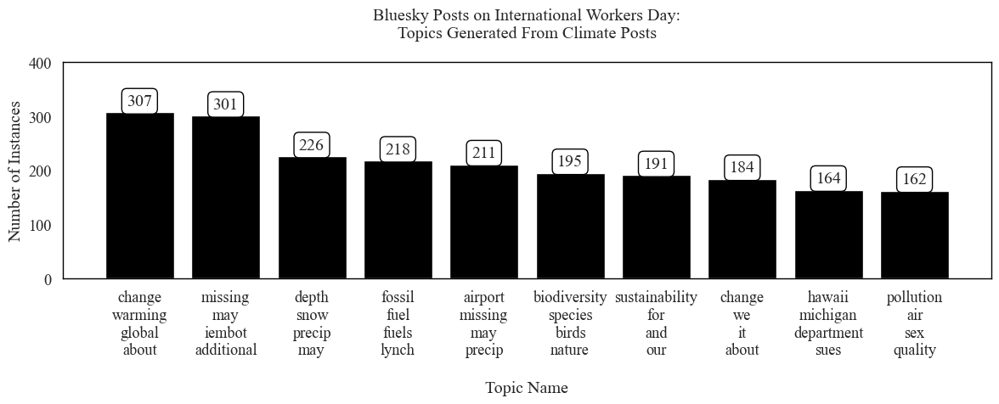

In [154]:
climate_freq_plotting = climate_frequencies.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=climate_freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Climate Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)
ax.set_ylim(0, 400)

# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Topic Model - Climate Posts - Most Frequent Topics.png",dpi=500)
plt.show();

### 2.4 Sentiment Analysis

In [171]:
def compound_sentiment(post):
    sentiments = sia.polarity_scores(post)
    compound_sentiment = sentiments['compound']

    return (compound_sentiment)

In [196]:
def sentiment_calculator(docs, topic_model, frequencies):
    document_info = topic_model.get_document_info(docs)

    document_info['Compound Sentiment'] = document_info['Document'].apply(lambda x: compound_sentiment(x))

    topic_groups = document_info.groupby(by='Topic')
    topic_numbers = list(set(document_info['Topic'].to_list()))

    topic_and_sentiment = []
    for topic in topic_numbers:
        
        current_topic = topic_groups.get_group(topic)
        current_name = current_topic.iloc[0]['Name']
        topic_average = current_topic['Compound Sentiment'].mean()

        topic_and_sentiment.append({'Topic':topic,'Name':current_name,'Avg. Compound Sentiment':topic_average})

    topic_sentiments = pd.DataFrame(topic_and_sentiment)

    data = pd.merge(left=topic_sentiments, right = frequencies, left_on= ['Name','Topic'], right_on = ['Name', 'Topic'],validate='1:1')
    return (data)

In [197]:
climate_topic_sentiments = sentiment_calculator(climate_docs, climate_topic_model, climate_frequencies)

In [198]:
climate_topic_sentiments.head()

,Topic,Name,Avg. Compound Sentiment,level_0,index,count,Percentage,Topic Name Clean
0,0,0_airport_missing_may_precip,-0.463966,4,4,211,0.027460,airport\nmissing\nmay\nprecip
1,1,1_biodiversity_species_birds_nature,0.158269,5,5,195,0.025377,biodiversity\nspecies\nbirds\nnature
2,2,2_fossils_fossilized_fossil_old,0.094045,10,10,154,0.020042,fossils\nfossilized\nfossil\nold
3,3,3_hawaii_michigan_department_sues,-0.014320,8,8,164,0.021343,hawaii\nmichigan\ndepartment\nsues
4,4,4_election_australia_auspol_coalition,0.055649,11,11,153,0.019912,election\naustralia\nauspol\ncoalition


In [228]:
climate_topic_sentiments.to_csv("Climate Topic Frequencies with Sentiment.csv")

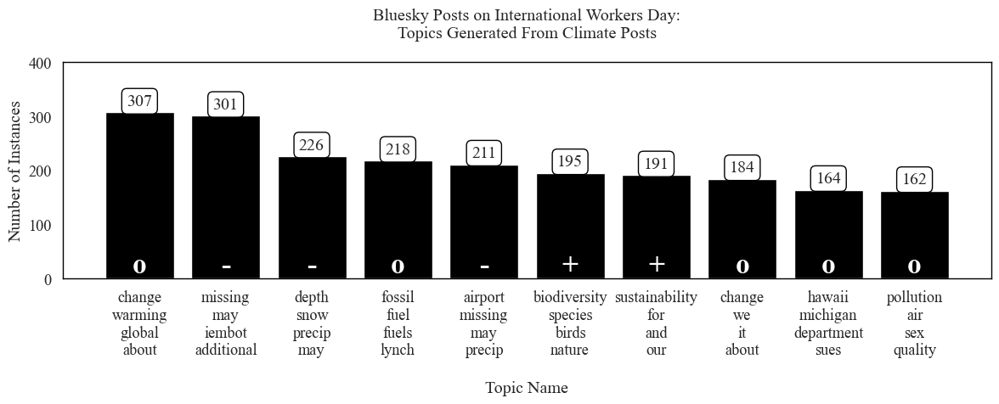

In [223]:
climate_freq_plotting = climate_topic_sentiments.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=climate_freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )


for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Climate Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)
ax.set_ylim(0, 400)

bars = hist.patches  # list of matplotlib Rectangle objects for each bar

for bar, (_, row) in zip(bars, climate_freq_plotting.iterrows()):
    x = bar.get_x() + bar.get_width() / 2  # center of the bar
    y = bar.get_height()

    ax.text(
        x,
        0,  # adjust vertical position above bar
        sentiment_symbol(row['Avg. Compound Sentiment']),
        ha='center',
        va='bottom',
        fontsize=24,
        fontweight='bold',
        color='white'
    )

# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Topic Model - Climate Posts - Most Frequent Topics - With Sentiment.png",dpi=500)
plt.show();

### 2.5 Comapring with Association Rule Mining Results

## 3. RQ 2: What are the prevailing trends and patterns in how Bluesky users discuss worker's rights on social media on International Workers Day?

In [25]:
labor_only = pd.read_csv("Sample of Labor Only.csv")

### 3.1 Instantiating a topic model

In [58]:
vectorizer_model = CountVectorizer(ngram_range=(1, 3), stop_words="english",decode_error='replace',strip_accents='ascii',
                                  lowercase=True)
labor_topic_model = BERTopic(vectorizer_model=vectorizer_model,verbose=True)

In [59]:
labor_docs = labor_only['clean text'].to_list()
  ## Using model.fit_transform, to apply to the list of documents. This will both embedd and assign topics to the texts in the document lists.
labor_topics, labor_probs = labor_topic_model.fit_transform(labor_docs)

2025-05-17 20:16:05,085 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/55 [00:00<?, ?it/s]

2025-05-17 20:16:21,189 - BERTopic - Embedding - Completed ✓
2025-05-17 20:16:21,190 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-17 20:16:31,631 - BERTopic - Dimensionality - Completed ✓
2025-05-17 20:16:31,632 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-17 20:16:31,730 - BERTopic - Cluster - Completed ✓
2025-05-17 20:16:31,734 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-05-17 20:16:32,137 - BERTopic - Representation - Completed ✓


In [60]:
reduced_topics = labor_topic_model.reduce_outliers(labor_docs, labor_topics)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.52it/s]


In [61]:
labor_topic_model.update_topics(labor_docs, topics=reduced_topics)

2025-05-17 20:16:32,741 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [62]:
labor_topics = labor_topic_model.get_topics()

In [63]:
labor_topic_info = labor_topic_model.get_topic_info()

```python 
labor_topic_info
```
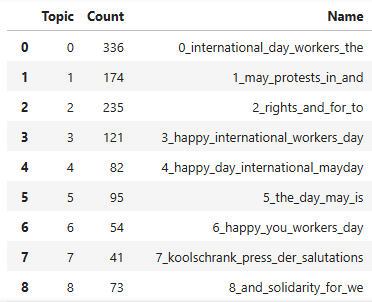

In [65]:
labor_topic_info.to_csv("Labor Post Only Topic Info.csv")

#### 3.2 Visualizing the Topics

In [66]:
labor_intertopic_distances = labor_topic_model.visualize_topics()

In [67]:
labor_intertopic_distances

In [120]:
labor_intertopic_distances.write_html("Labor Sample Intertopic Distances.html")

In [68]:
''' Visualize hierarhcies through text trees:'''
labor_hierarchical_topics = labor_topic_model.hierarchical_topics(labor_docs)
labor_tree = labor_topic_model.get_topic_tree(labor_hierarchical_topics)
print (labor_tree)

100%|█████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 188.25it/s]


.
├─koolschrank_salutations_der_press_from
│    ├─■──koolschrank_press_der_salutations_from ── Topic: 7
│    └─■──salutations_koolschrank_der_from_day ── Topic: 22
└─the_workers_day_and_to
     ├─workers_day_the_and_to
     │    ├─happy_international_day_workers_you
     │    │    ├─■──taxes_pigs_that_fuck_rely ── Topic: 27
     │    │    └─happy_day_international_workers_you
     │    │         ├─happy_day_international_workers_you
     │    │         │    ├─■──happy_my_international_you_day ── Topic: 12
     │    │         │    └─happy_day_international_workers_you
     │    │         │         ├─happy_day_international_workers_to
     │    │         │         │    ├─■──happy_you_workers_day_your ── Topic: 6
     │    │         │         │    └─happy_international_day_workers_may
     │    │         │         │         ├─■──happy_international_workers_day_my ── Topic: 3
     │    │         │         │         └─■──happy_day_international_mayday_may ── Topic: 4
     │    │         │  

### 3.3 Generating Topic Frequencies

In [146]:
labor_frequencies = frequency_counter(labor_topics,labor_docs, labor_topic_info, len(labor_only), labor_topic_model)

In [147]:
labor_frequencies

,level_0,index,Name,count,Percentage,Topic,Topic Name Clean
0,0,0,0_international_day_workers_the,336,0.192440,0,international\nday\nworkers\nthe
1,1,1,2_rights_and_for_to,235,0.134593,2,rights\nand\nfor\nto
2,2,2,1_may_protests_in_and,174,0.099656,1,may\nprotests\nin\nand
3,3,3,3_happy_international_workers_day,121,0.069301,3,happy\ninternational\nworkers\nday
4,4,4,5_the_day_may_is,95,0.054410,5,the\nday\nmay\nis
5,5,5,4_happy_day_international_mayday,82,0.046964,4,happy\nday\ninternational\nmayday
6,6,6,8_and_solidarity_for_we,73,0.041810,8,and\nsolidarity\nfor\nwe
7,7,7,6_happy_you_workers_day,54,0.030928,6,happy\nyou\nworkers\nday
8,8,8,10_solidarity_and_international_workers,49,0.028064,10,solidarity\nand\ninternational\nworkers
9,9,9,9_haymarket_affair_the_in,48,0.027491,9,haymarket\naffair\nthe\nin


In [148]:
labor_frequencies.to_csv("Labor Topic Frequencies.csv")

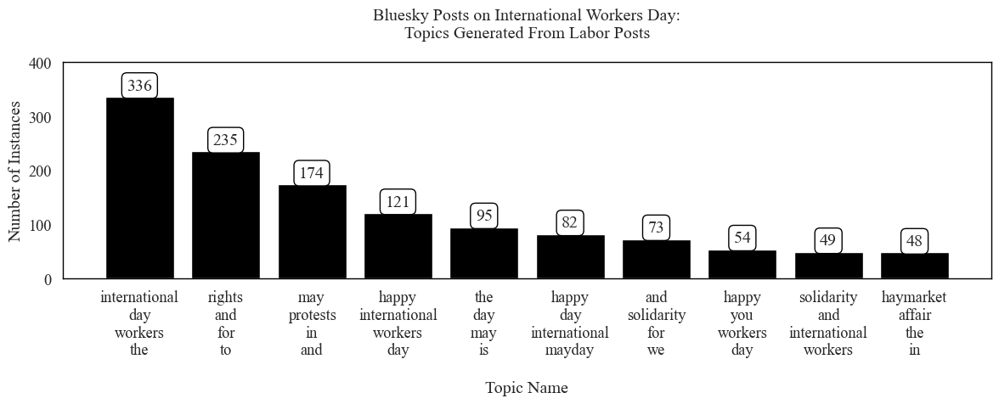

In [155]:
labor_freq_plotting = labor_frequencies.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=labor_freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Labor Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)


# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

ax.set_ylim(0, 400)
plt.tight_layout()
plt.savefig("Topic Model - Labor Posts - Most Frequent Topics.png",dpi=500)
plt.show();

### 3.4 Sentiment Analysis

In [215]:
labor_topic_sentiments = sentiment_calculator(labor_docs, labor_topic_model, labor_frequencies)

In [216]:
labor_topic_sentiments.head()

,Topic,Name,Avg. Compound Sentiment,level_0,index,count,Percentage,Topic Name Clean
0,0,0_international_day_workers_the,0.253829,0,0,336,0.192440,international\nday\nworkers\nthe
1,1,1_may_protests_in_and,0.081451,2,2,174,0.099656,may\nprotests\nin\nand
2,2,2_rights_and_for_to,0.192357,1,1,235,0.134593,rights\nand\nfor\nto
3,3,3_happy_international_workers_day,0.600361,3,3,121,0.069301,happy\ninternational\nworkers\nday
4,4,4_happy_day_international_mayday,0.586005,5,5,82,0.046964,happy\nday\ninternational\nmayday


In [227]:
labor_topic_sentiments.to_csv("Labor Topic Frequencies with Sentiment.csv")

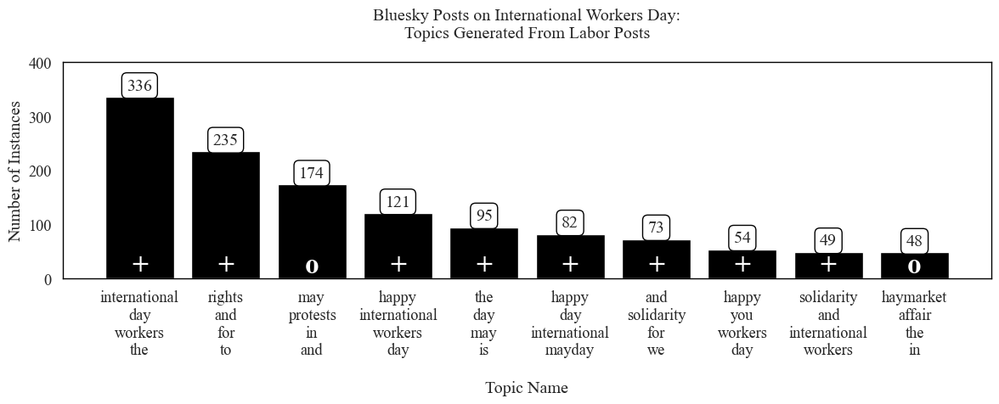

In [233]:
labor_freq_plotting = labor_topic_sentiments.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=labor_freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )


for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Labor Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)
ax.set_ylim(0, 400)

bars = hist.patches  # list of matplotlib Rectangle objects for each bar

for bar, (_, row) in zip(bars, labor_freq_plotting.iterrows()):
    x = bar.get_x() + bar.get_width() / 2  # center of the bar
    y = bar.get_height()

    ax.text(
        x,
        0,  # adjust vertical position above bar
        sentiment_symbol(row['Avg. Compound Sentiment']),
        ha='center',
        va='bottom',
        fontsize=24,
        fontweight='bold',
        color='white'
    )

# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Topic Model - Labor Posts - Most Frequent Topics - With Sentiment.png",dpi=500)
plt.show();

### 3.5 Comparing with Association Rule Mining Results

## 4. RQ 3: What are the prevailing trends and patterns in how Bluesky users discuss worker's rights and climate change on social media on International Workers Day?

**Note:** This is run with the entire corpus, not only the 15 posts that had overlap between climate and labor words.

In [83]:
both_labels = pd.read_csv('Climate and Workers Posts Posts - May 1st.csv')

### 4.1 Instantiating a topic Model

In [86]:
vectorizer_model = CountVectorizer(ngram_range=(1, 3), stop_words="english",decode_error='replace',strip_accents='ascii',
                                  lowercase=True)
topic_model = BERTopic(vectorizer_model=vectorizer_model,verbose=True)

In [87]:
docs = both_labels['clean text'].to_list()
  ## Using model.fit_transform, to apply to the list of documents. This will both embedd and assign topics to the texts in the document lists.
topics, probs = topic_model.fit_transform(docs)

2025-05-17 20:20:01,891 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/304 [00:00<?, ?it/s]

2025-05-17 20:21:37,676 - BERTopic - Embedding - Completed ✓
2025-05-17 20:21:37,677 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-17 20:22:20,381 - BERTopic - Dimensionality - Completed ✓
2025-05-17 20:22:20,382 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-17 20:22:21,000 - BERTopic - Cluster - Completed ✓
2025-05-17 20:22:21,006 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-05-17 20:22:23,701 - BERTopic - Representation - Completed ✓


In [91]:
reduced_topics = topic_model.reduce_outliers(docs, topics)
topic_model.update_topics(docs, topics=reduced_topics)
topics = topic_model.get_topics()

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  2.55it/s]
2025-05-17 20:23:08,232 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [92]:
topic_info = topic_model.get_topic_info()

``` python
topic_info
```
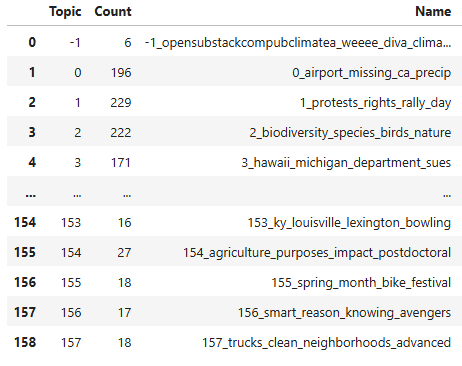

In [94]:
topic_info.to_csv("Full Sample Topic Info.csv")

#### 4.2 Visualizing the Topics

In [96]:
intertopic_distances = topic_model.visualize_topics()

In [97]:
intertopic_distances

In [98]:
intertopic_distances.write_html("Full Sample Intertopic Distances.html")

### 4.3 Generating Topic Frequencies

In [150]:
frequencies = frequency_counter(topics,docs, topic_info, len(both_labels), topic_model)

In [151]:
frequencies

,level_0,index,Name,count,Percentage,Topic,Topic Name Clean
0,0,0,10_international_day_workers_st,418,0.043106,10,international\nday\nworkers\nst
1,1,1,9_missing_precip_high_low,391,0.040322,9,missing\nprecip\nhigh\nlow
2,2,2,4_rights_workers_labor_fight,301,0.031041,4,rights\nworkers\nlabor\nfight
3,3,3,29_change_about_climate_it,253,0.026091,29,change\nabout\nclimate\nit
4,4,4,12_fossil_fuel_fuels_industry,246,0.025369,12,fossil\nfuel\nfuels\nindustry
...,...,...,...,...,...,...,...
154,154,154,128_nj_trenton_newark_atlantic,14,0.001444,128,nj\ntrenton\nnewark\natlantic
155,155,155,129_valdosta_apalachicola_valparaiso_apr,14,0.001444,129,valdosta\napalachicola\nvalparaiso\napr
156,156,156,146_jackson_ky_snow_precip,13,0.001341,146,jackson\nky\nsnow\nprecip
157,157,157,143_insideclimatenewsorgnews_bad_isd_calhoun,13,0.001341,143,insideclimatenewsorgnews\nbad\nisd\ncalhoun


In [152]:
frequencies.to_csv("Topic Frequencies.csv")

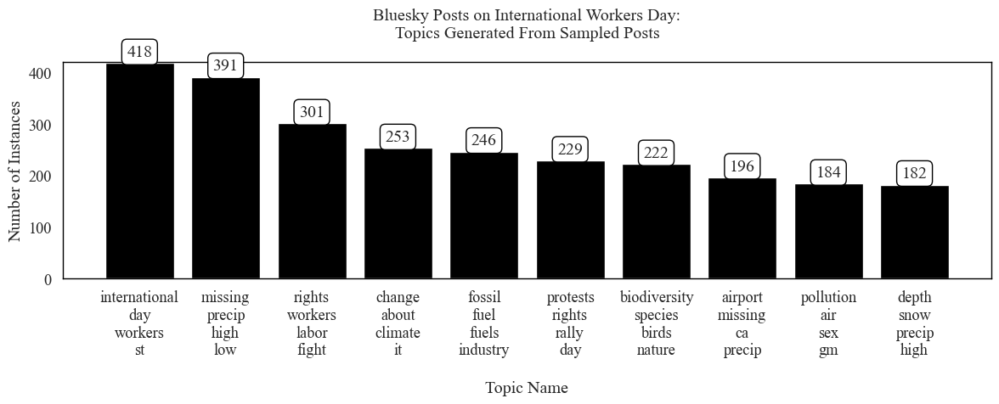

In [157]:
freq_plotting = frequencies.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )

for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Sampled Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)


# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border
ax.set_ylim(0, 420)
plt.tight_layout()
plt.savefig("Topic Model - Posts - Most Frequent Topics.png",dpi=500)
plt.show();

### 4.4 Sentiment Analysis

In [224]:
topic_sentiments = sentiment_calculator(docs, topic_model, frequencies)

In [225]:
topic_sentiments.head()

,Topic,Name,Avg. Compound Sentiment,level_0,index,count,Percentage,Topic Name Clean
0,0,0_airport_missing_ca_precip,-0.439197,7,7,196,0.020212,airport\nmissing\nca\nprecip
1,1,1_protests_rights_rally_day,0.067968,5,5,229,0.023616,protests\nrights\nrally\nday
2,2,2_biodiversity_species_birds_nature,0.174349,6,6,222,0.022894,biodiversity\nspecies\nbirds\nnature
3,3,3_hawaii_michigan_department_sues,-0.013791,10,10,171,0.017634,hawaii\nmichigan\ndepartment\nsues
4,4,4_rights_workers_labor_fight,0.231227,2,2,301,0.031041,rights\nworkers\nlabor\nfight


In [226]:
topic_sentiments.to_csv("Full Topic Frequencies with Sentiment.csv")

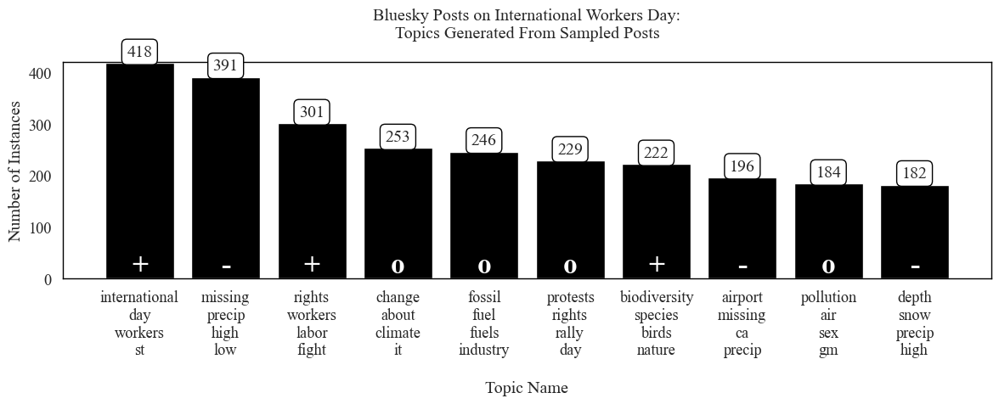

In [231]:
freq_plotting = topic_sentiments.sort_values(by='count', ascending=False)[0:10]

sb.set_style("white")
sb.set(font='Times New Roman', font_scale=1.2)

fig, ax = plt.subplots(figsize=(12,5))

hist = sb.barplot(data=freq_plotting, x="Topic Name Clean", y="count", color="black", ax=ax)

for bar_group in hist.containers:  # `containers` contains the histogram bars grouped by hue
    # Get heights and centers for each group
    heights = [bar.get_height() for bar in bar_group]
    centers = [bar.get_x() + bar.get_width() / 2 for bar in bar_group]
    
    # Add markers
    plt.scatter(centers, heights, color='black', zorder=3)
    
    for center, height in zip(centers, heights):
        plt.text(
            center, 
            height, 
            f'{int(height):,}',  # Format with commas
            color='black', 
            ha='center', 
            va='bottom', 
            fontsize=10
        )


for container in hist.containers:
    hist.bar_label(container, fmt='%d', label_type='edge', padding=3, bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

hist.set_title("Bluesky Posts on International Workers Day:\nTopics Generated From Sampled Posts\n")
hist.set_xlabel("\nTopic Name")
hist.set_ylabel("Number of Instances")
ax.tick_params(axis='x')
ax.grid(True)
ax.set_facecolor("white")

formatter = FuncFormatter(lambda x, _: f'{int(x):,}')
ax.yaxis.set_major_formatter(formatter)
ax.set_ylim(0, 420)

bars = hist.patches  # list of matplotlib Rectangle objects for each bar

for bar, (_, row) in zip(bars, freq_plotting.iterrows()):
    x = bar.get_x() + bar.get_width() / 2  # center of the bar
    y = bar.get_height()

    ax.text(
        x,
        0,  # adjust vertical position above bar
        sentiment_symbol(row['Avg. Compound Sentiment']),
        ha='center',
        va='bottom',
        fontsize=24,
        fontweight='bold',
        color='white'
    )

# Set the border (box) around the entire plot
for spine in ax.spines.values():
    spine.set_edgecolor('black')  # Set the color of the border to black
    spine.set_linewidth(1)  # Set the width of the border

plt.tight_layout()
plt.savefig("Topic Model - Posts - Most Frequent Topics - With Sentiment.png",dpi=500)
plt.show();

### 4.5 A Basic EDA of What is in the overlapping posts

In [238]:
exclusive_both = pd.read_csv("Sample of Both.csv")
both_posts = exclusive_both['clean text'].to_list()

In [ ]:
for post in both_posts:
    print (post)
    print ("\n")

In [248]:
''' SOURCE: GEEKS FOR GEEKS GENERATING WORD CLOUD PYTHON '''

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.update([## list of users that were anonnoymized from generating the wordclouds##])
 
# iterate through the. csv file
for val in both_posts:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "



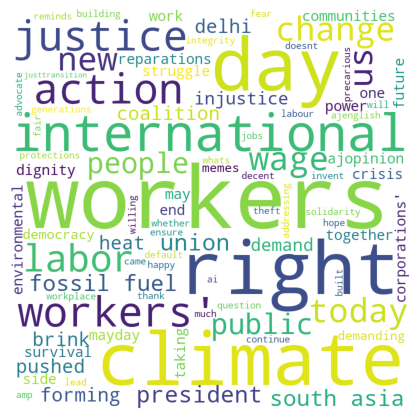

In [249]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 15).generate(comment_words)
 
# plot the WordCloud image                       
plt.figure(figsize = (4, 4), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 

plt.savefig('Overlap Posts - Both Labels Climate and Labor.png',dpi=500)
plt.show()

### 4.6 EDA of Hashtags Used in All Posts

In [253]:
posts = both_labels['text']

In [267]:
hashtag_pattern = r'#.+'
hashtag_pattern = r'(#.+?)(?=\s)'
all_hashtags = []

for post in posts:
    found_hts = re.findall(hashtag_pattern,post)
    all_hashtags.extend(found_hts)

In [268]:
print (f"The total number of hashtags found are: {len(all_hashtags)}. The number of unique hashtags found are: {len(list(set(all_hashtags)))}.")

The total number of hashtags found are: 5612. The number of unique hashtags found are: 3186.


In [275]:
hashtag_counts = pd.DataFrame(pd.DataFrame(all_hashtags).value_counts()).reset_index()
hashtag_counts.rename(columns={0:'Hashtag', 'count':'Frequency'},inplace=True)
hashtag_counts

,Hashtag,Frequency
0,#MayDay,101
1,#Climate,65
2,#climate,64
3,#ClimateCrisis,48
4,#climatechange,46
...,...,...
3181,#MayHolidays,1
3182,#MaydayProtests,1
3183,#MaydayRally,1
3184,#MedSky,1


In [279]:
freq_dict = dict(zip(hashtag_counts['Hashtag'], hashtag_counts['Frequency']))

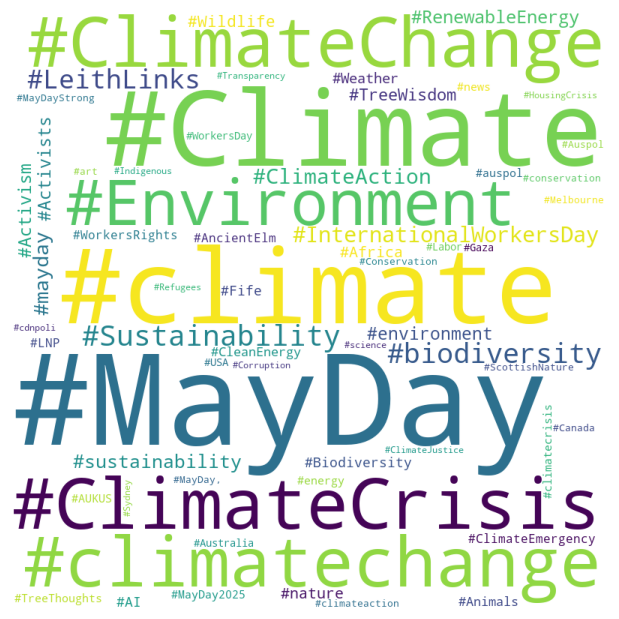

In [285]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 12, max_words=500).generate_from_frequencies(freq_dict)
 
# plot the WordCloud image                       
plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 

plt.savefig('Hashtags in the Entire Corpus.png',dpi=500)
plt.show()